<a href="https://colab.research.google.com/github/Dani3113R0se/Contiguity-Data/blob/main/Geospatial_Data_DB.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [3]:
import pandas as pd
!pip install geopandas
!pip install geoplot

## Art Installations in NYC Subways
Throughout the years, NYC has commissioned artists to add artwork to subway stations for commuters. Where are these works located? What lines can you take to encounter the art?
I use data from the MTA on subway stations with art. The data also include descriptions of the art, year it was installed, the artist, etc.

In [29]:
import pandas as pd
url = 'https://raw.githubusercontent.com/Dani3113R0se/Geospatial-Data-Tutorial-/refs/heads/main/MTA_Permanent_Art_Catalog__Beginning_1980_20250319.csv'

art = pd.read_csv(url, encoding='latin-1')

# Review the columns and their descriptions
print(art.info())

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 381 entries, 0 to 380
Data columns (total 9 columns):
 #   Column           Non-Null Count  Dtype 
---  ------           --------------  ----- 
 0   Agency           381 non-null    object
 1   Station Name     381 non-null    object
 2   Line             378 non-null    object
 3   Artist           381 non-null    object
 4   Art Title        381 non-null    object
 5   Art Date         381 non-null    int64 
 6   Art Material     381 non-null    object
 7   Art Description  378 non-null    object
 8   Art Image Link   376 non-null    object
dtypes: int64(1), object(8)
memory usage: 26.9+ KB
None


## Subway Stations
This is a data set from the MTA on the subway stops themselves.

In [30]:
import pandas as pd
url = 'https://raw.githubusercontent.com/Dani3113R0se/Geospatial-Data-Tutorial-/refs/heads/main/MTA_Subway_Entrances_and_Exits__2024_20250319.csv'

subway = pd.read_csv(url, encoding='latin-1')

# Review the columns and their descriptions
print(subway.info())

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2120 entries, 0 to 2119
Data columns (total 15 columns):
 #   Column                    Non-Null Count  Dtype  
---  ------                    --------------  -----  
 0   Division                  2120 non-null   object 
 1   Line                      2120 non-null   object 
 2   Borough                   2120 non-null   object 
 3   Stop Name                 2120 non-null   object 
 4   Complex ID                2120 non-null   int64  
 5   Constituent Station Name  2120 non-null   object 
 6   Station ID                2120 non-null   int64  
 7   GTFS Stop ID              2120 non-null   object 
 8   Daytime Routes            2120 non-null   object 
 9   Entrance Type             2120 non-null   object 
 10  Entry Allowed             2120 non-null   object 
 11  Exit Allowed              2120 non-null   object 
 12  Entrance Latitude         2120 non-null   float64
 13  Entrance Longitude        2120 non-null   float64
 14  entrance

# Merging Data
The art data does not have the latitude and longitude geocodes necessary for mapping. There are ways around this! My idea for mapping the art installations at each station is to merge the data with another data set that *does* have the geocodes.

What is crucial here is that both data sets have a column for the station name. In the art df, this column is Column 1: Station name. In the subway dataframe, it is Column 5: Constituent Station Name.

In [31]:
# Rename 1 station column to make merging easier
subway = subway.rename(columns={'Constituent Station Name': 'Station Name'})
print(subway.columns)
print(art.columns)

# Left Join
subway_art = pd.merge(art, subway, on='Station Name', how='left')

#Check out merged df
print(subway_art.info())

Index(['Division', 'Line', 'Borough', 'Stop Name', 'Complex ID',
       'Station Name', 'Station ID', 'GTFS Stop ID', 'Daytime Routes',
       'Entrance Type', 'Entry Allowed', 'Exit Allowed', 'Entrance Latitude',
       'Entrance Longitude', 'entrance_georeference'],
      dtype='object')
Index(['Agency', 'Station Name', 'Line', 'Artist', 'Art Title', 'Art Date',
       'Art Material', 'Art Description', 'Art Image Link'],
      dtype='object')
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2453 entries, 0 to 2452
Data columns (total 23 columns):
 #   Column                 Non-Null Count  Dtype  
---  ------                 --------------  -----  
 0   Agency                 2453 non-null   object 
 1   Station Name           2453 non-null   object 
 2   Line_x                 2450 non-null   object 
 3   Artist                 2453 non-null   object 
 4   Art Title              2453 non-null   object 
 5   Art Date               2453 non-null   int64  
 6   Art Material          

## Make a Shapefile
In order to plot geo coordinates, we need to first make a shapefile, rather than read from the data frame we just made from merging. This is how Python can read that the objects are spatial data and lay them on a spatial projection.

In [32]:
# Ensure your data has columns with latitude and longitude
# Rename the columns to 'latitude' and 'longitude' if they are not already named that. Ours are not
subway_art.rename(columns={'Entrance Latitude': 'latitude', 'Entrance Longitude': 'longitude'}, inplace=True)

# Import the necessary module
from shapely.geometry import Point
import geopandas # Import the geopandas library

# Create a geometry column using the latitude and longitude
geometry = [Point(xy) for xy in zip(subway_art['longitude'], subway_art['latitude'])]

# Create a GeoDataFrame
gdf = geopandas.GeoDataFrame(subway_art, geometry=geometry, crs="EPSG:4326")

# Save as a shapefile
output_shapefile_path = 'subway_art.shp'
gdf.to_file(output_shapefile_path, driver='ESRI Shapefile')

<ipython-input-32-d9075c018cd9>:17: UserWarning: Column names longer than 10 characters will be truncated when saved to ESRI Shapefile.
  gdf.to_file(output_shapefile_path, driver='ESRI Shapefile')
/usr/local/lib/python3.11/dist-packages/pyogrio/raw.py:723: RuntimeWarning: Normalized/laundered field name: 'Station Name' to 'Station Na'
  ogr_write(
/usr/local/lib/python3.11/dist-packages/pyogrio/raw.py:723: RuntimeWarning: Normalized/laundered field name: 'Art Material' to 'Art Materi'
  ogr_write(
/usr/local/lib/python3.11/dist-packages/pyogrio/raw.py:723: RuntimeWarning: Normalized/laundered field name: 'Art Description' to 'Art Descri'
  ogr_write(
/usr/local/lib/python3.11/dist-packages/pyogrio/raw.py:723: RuntimeWarning: Normalized/laundered field name: 'Art Image Link' to 'Art Image'
  ogr_write(
/usr/local/lib/python3.11/dist-packages/pyogrio/raw.py:723: RuntimeWarning: Normalized/laundered field name: 'GTFS Stop ID' to 'GTFS Stop'
  ogr_write(
/usr/local/lib/python3.11/dist-pac

## Mapping our own Shapefile
Did we make the shapefile correctly? We can browse the file we made with viusal tools.

Text(0.5, 1.0, 'Subway Art Points')

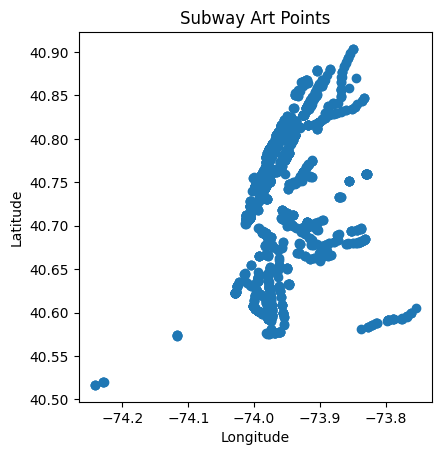

In [33]:
%matplotlib inline
import matplotlib.pyplot as plt

gdf.plot()
plt.xlabel("Longitude")
plt.ylabel("Latitude")
plt.title("Subway Art Points")


## There are lots of points?
Yep! If you know the shape of NYC, you might be able to pick out that we did in fact plot the subway art data in the correct crs. This is a great way to glance at point data for regions that you are an expert on. There are other data analysis tasks that could benefit from this quick point visualization. Most of the time, it will be better to present point data on a base map. Lets get one of NYC.

In this example, I show how to plot point, line and polygon data onto a basemap. These are all spatially different, and you should consider what type of "layer" your data would be on a map.

Extracting 'nybb_16a/nybb.shp' from '/root/.cache/geodatasets/nybb_16a.zip' to '/root/.cache/geodatasets/nybb_16a.zip.unzip'
Extracting 'nybb_16a/nybb.shx' from '/root/.cache/geodatasets/nybb_16a.zip' to '/root/.cache/geodatasets/nybb_16a.zip.unzip'
Extracting 'nybb_16a/nybb.dbf' from '/root/.cache/geodatasets/nybb_16a.zip' to '/root/.cache/geodatasets/nybb_16a.zip.unzip'
Extracting 'nybb_16a/nybb.prj' from '/root/.cache/geodatasets/nybb_16a.zip' to '/root/.cache/geodatasets/nybb_16a.zip.unzip'


   BoroCode       BoroName     Shape_Leng    Shape_Area  \
0         5  Staten Island  330470.010332  1.623820e+09   
1         4         Queens  896344.047763  3.045213e+09   
2         3       Brooklyn  741080.523166  1.937479e+09   
3         1      Manhattan  359299.096471  6.364715e+08   
4         2          Bronx  464392.991824  1.186925e+09   

                                            geometry  
0  MULTIPOLYGON (((970217.022 145643.332, 970227....  
1  MULTIPOLYGON (((1029606.077 156073.814, 102957...  
2  MULTIPOLYGON (((1021176.479 151374.797, 102100...  
3  MULTIPOLYGON (((981219.056 188655.316, 980940....  
4  MULTIPOLYGON (((1012821.806 229228.265, 101278...  


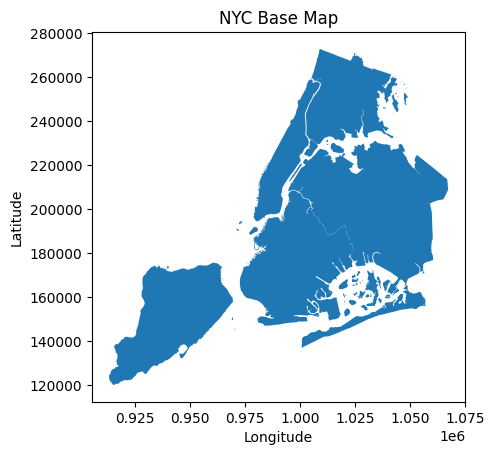

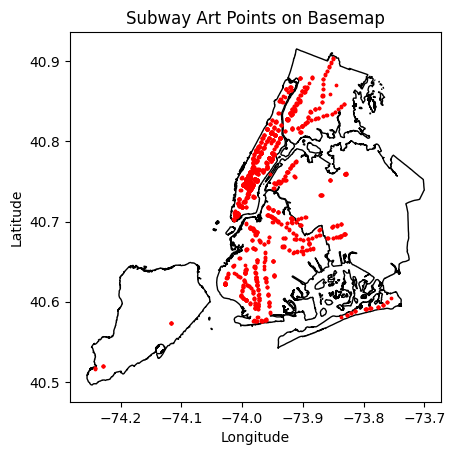

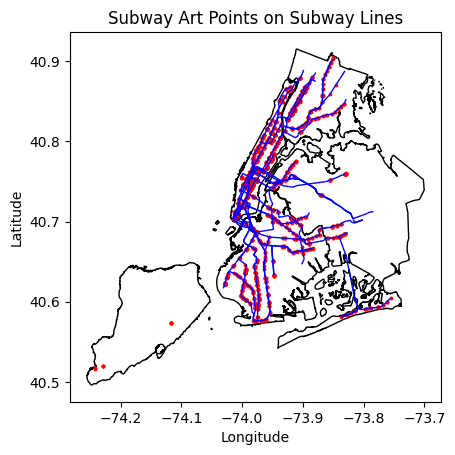

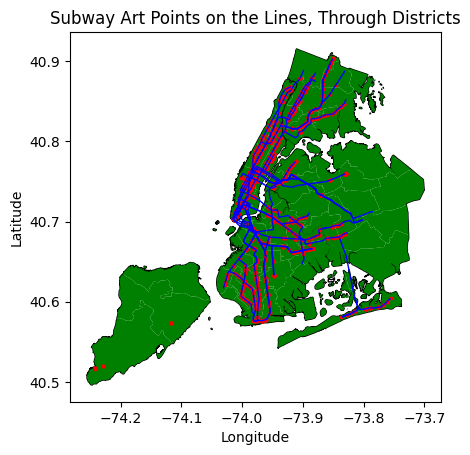

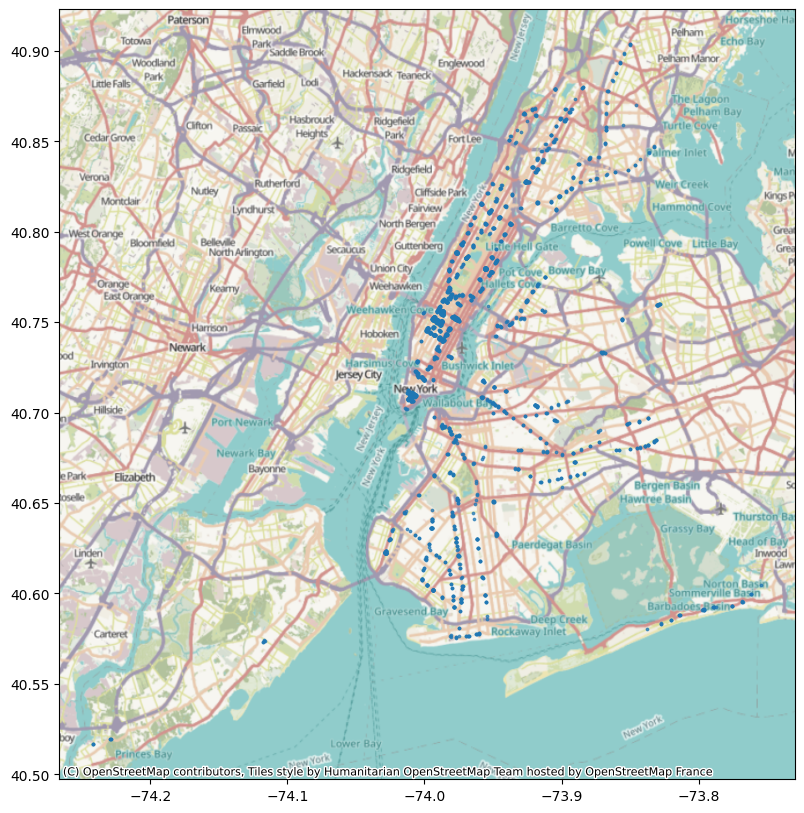

In [34]:
!pip install geodatasets
import geopandas
import geodatasets

#the geodatasets package contains basemaps for cities, countries, etc. NYC's is "nybb"
nyc_path = geodatasets.get_path("nybb")

# make a geodata frame from the path extract
nyc_base = geopandas.read_file(nyc_path)

print(nyc_base.head()) # Display the first few rows

#plot only the base we made to see if it is NYC-shaped
nyc_base.plot()
plt.xlabel("Longitude")
plt.ylabel("Latitude")
plt.title("NYC Base Map")
plt.show()

# Now we can layer the points from the gdf shapefile we made onto the basemap
nyc_base = nyc_base.to_crs(gdf.crs) #this makes the basemap crs match the gdf crs
base = nyc_base.plot(color='white', edgecolor='black') #define basemap layer
gdf.plot(ax=base, marker='o', color='red', markersize=3) #plot and note you can change the color and marker size
plt.xlabel("Longitude")
plt.ylabel("Latitude")
plt.title("Subway Art Points on Basemap")

# Add subway lines too
url = 'https://github.com/Dani3113R0se/Geospatial-Data-Tutorial-/raw/refs/heads/main/Subway%20Lines.geojson'
sub_lines = geopandas.read_file(url)
  #plot
base = nyc_base.plot(color='white', edgecolor='black') #basemap
sub_lines.plot(ax=base, color='blue', linewidth=1) #subway line layer
gdf.plot(ax=base, marker='o', color='red', markersize=3) #art point layer
plt.xlabel("Longitude")
plt.ylabel("Latitude")
plt.title("Subway Art Points on Subway Lines")
plt.show()

# Add City Council Districts as a polygon
url = 'https://github.com/Dani3113R0se/Geospatial-Data-Tutorial-/raw/main/City%20Council%20Districts.geojson' # Changed 'blob' to 'raw' in the URL
districts = geopandas.read_file(url)
  #plot
base = nyc_base.plot(color='white', edgecolor='black') #basemap
sub_lines.plot(ax=base, color='blue', linewidth=1) #subway line layer
districts.plot(ax=base, color='green') #district layer
gdf.plot(ax=base, marker='o', color='red', markersize=3) #art point layer
plt.xlabel("Longitude")
plt.ylabel("Latitude")
plt.title("Subway Art Points on the Lines, Through Districts")
plt.show()


#Next, contextily for a detailed basemap
import contextily as ctx
ax = gdf.plot(figsize=(10, 10), alpha=0.7, markersize=3)
ctx.add_basemap(ax, crs=gdf.crs)
plt.show()


## Using your own Basemap Shape File
Sometimes we want to plot very specific shapefiles for boundaries, districts, or smaller areas that are not defined in some of the geo datasets. A common example is downloading official boundary shapefiles for a city or area for official reserach. If you have a shapefile, you can import that into python as well. I am using the 2020 Tract data for NYC.


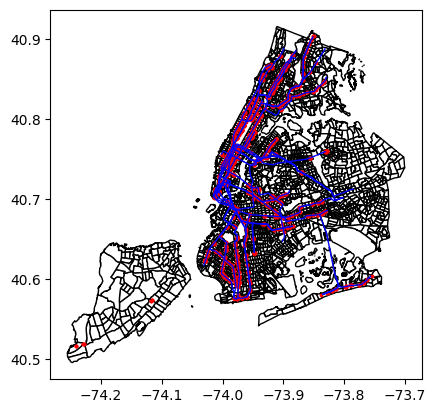

In [35]:
# This is a geojson file example, which is the same process we followed for the subway line data
url = 'https://services5.arcgis.com/GfwWNkhOj9bNBqoJ/arcgis/rest/services/NYC_Census_Tracts_for_2020_US_Census/FeatureServer/0/query?where=1=1&outFields=*&outSR=4326&f=pgeojson'
census_shp = geopandas.read_file(url) #the geopandas pacakge can convert this to a shapefile

census_base = census_shp.to_crs(gdf.crs) #this makes the basemap crs match the gdf crs
base = census_base.plot(color='white', edgecolor='black') #define basemap layer

sub_lines.plot(ax=base, color='blue', linewidth=1) #subway line layer
gdf.plot(ax=base, marker='o', color='red', markersize=3) #art point layer
plt.show()



## Geocoding
You can also geocode from the geopandas package. We can look at the Statue of Liberty

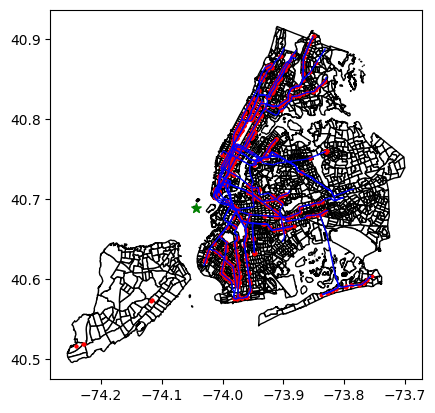

In [39]:
# Statue of Lib's address:
address = "Statue of Liberty, New York, NY 10004"
Lady_Lib = geopandas.tools.geocode(address)


url = 'https://services5.arcgis.com/GfwWNkhOj9bNBqoJ/arcgis/rest/services/NYC_Census_Tracts_for_2020_US_Census/FeatureServer/0/query?where=1=1&outFields=*&outSR=4326&f=pgeojson'
census_shp = geopandas.read_file(url) #the geopandas pacakge can convert this to a shapefile

census_base = census_shp.to_crs(gdf.crs) #this makes the basemap crs match the gdf crs
base = census_base.plot(color='white', edgecolor='black') #define basemap layer

sub_lines.plot(ax=base, color='blue', linewidth=1) #subway line layer
gdf.plot(ax=base, marker='o', color='red', markersize=3) #art point layer
Lady_Lib.plot(ax=base, marker='*', color='green', markersize=50) #Lady Lib layer
plt.show()



## Analyzing Big Geospatial Data
I am using geolocated "ping" censor data from the MTA. It is an indication of traffic speeds on street segments throughout the day. There are 11,655,097 data points in total. The best way for me to load such a big dataset into Google Colab, I loaded an R file I made from a query I made to the API. There just is not enough RAM to work with that data and show how I cleaned it - a little bit sad because that is a large part of working with geospatial data! We are working with this data aggregated to the average speed for every hour of the day for data collected between 2023 to the end of 2024. We should be able to see the average time travel at each hour of the day for each stop.

In [40]:
import pandas as pd # Import pandas

url = "https://github.com/Dani3113R0se/Geospatial-Data-Tutorial-/raw/refs/heads/main/NYC_ping.csv"
nyc_ping = pd.read_csv(url)

nyc_ping.head()

,Unnamed: 0,timepoint_stop_id,hour_of_day,timepoint_stop_latitude,timepoint_stop_longitude,next_timepoint_stop_latitude,next_timepoint_stop_longitude,avg_time
0,1,100014.0,6,40.872562,-73.888156,40.877071,-73.890065,5.737047
1,2,100014.0,7,40.872562,-73.888156,40.877071,-73.890065,6.829278
2,3,100014.0,8,40.872562,-73.888156,40.877071,-73.890065,6.649679
3,4,100014.0,9,40.872562,-73.888156,40.877071,-73.890065,6.532657
4,5,100014.0,10,40.872562,-73.888156,40.877071,-73.890065,6.643866


## First Plot the Ping Points
We can see where all of these ping points are!

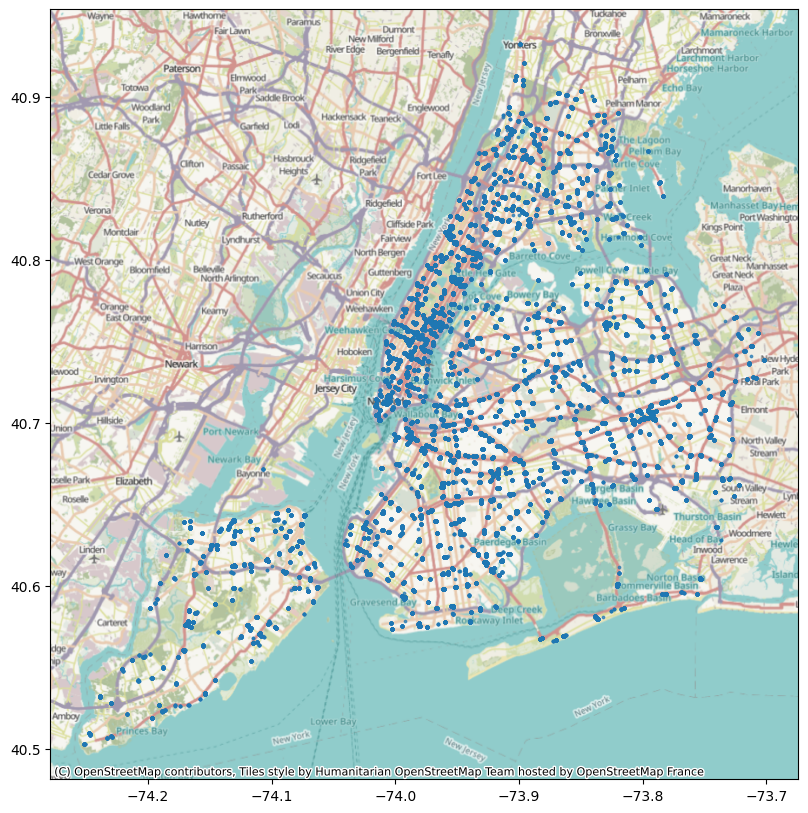

In [49]:
!pip install contextily # Install contextily with pip
from shapely.geometry import Point # Import the Point object from shapely.geometry
import geopandas # Import the geopandas library
import matplotlib.pyplot as plt # Import the pyplot module as plt

# Create a geometry column using the latitude and longitude
geometry = [Point(xy) for xy in zip(nyc_ping['timepoint_stop_longitude'], nyc_ping['timepoint_stop_latitude'])]

# Create a GeoDataFrame
gdf = geopandas.GeoDataFrame(nyc_ping, geometry=geometry, crs="EPSG:4326")

#Next, contextily for a detailed basemap
import contextily as ctx
ax = gdf.plot(figsize=(10, 10), alpha=0.7, markersize=3)
ctx.add_basemap(ax, crs=gdf.crs)
plt.show()



## Distance between ping points
THIS NEEDS TO BE SUBSET I THINK
We can calculate the distance between the geocoded points in our data.

In [ ]:
import geopandas as gpd
from shapely.geometry import LineString, Point
import geopandas as gpd

# Calculate distance matrix using GeoPandas distance function
distances = gdf.geometry.apply(lambda g: gdf.geometry.distance(g))

# Print the distance matrix
print(distances)

# If you want to add distances to the original dataframe:
gdf['distances'] = distances.values.tolist()

# Accessing distance between specific points
# For example, distance between the first and second point:
distance_between_points = gdf.loc[0, 'geometry'].distance(gdf.loc[1, 'geometry'])
print(f"Distance between first and second point: {distance_between_points}")


<ipython-input-52-76fd90198a08>:9: UserWarning: Geometry is in a geographic CRS. Results from 'distance' are likely incorrect. Use 'GeoSeries.to_crs()' to re-project geometries to a projected CRS before this operation.

  distances = gdf.geometry.apply(lambda g: gdf.geometry.distance(g))


## Making line segments
The ping data allows an inference on average speed and travel time by recording the timestamp a bus travels over one spot, then the next spot, and then calculating how long that took. This happens all throughout the day. So, it is more interesting to look at the segments between geopoints. We can make these lines since they are not in the data and plot them too.

/usr/local/lib/python3.11/dist-packages/shapely/measurement.py:103: RuntimeWarning: invalid value encountered in bounds
  return lib.bounds(geometry_arr, out=out, **kwargs)


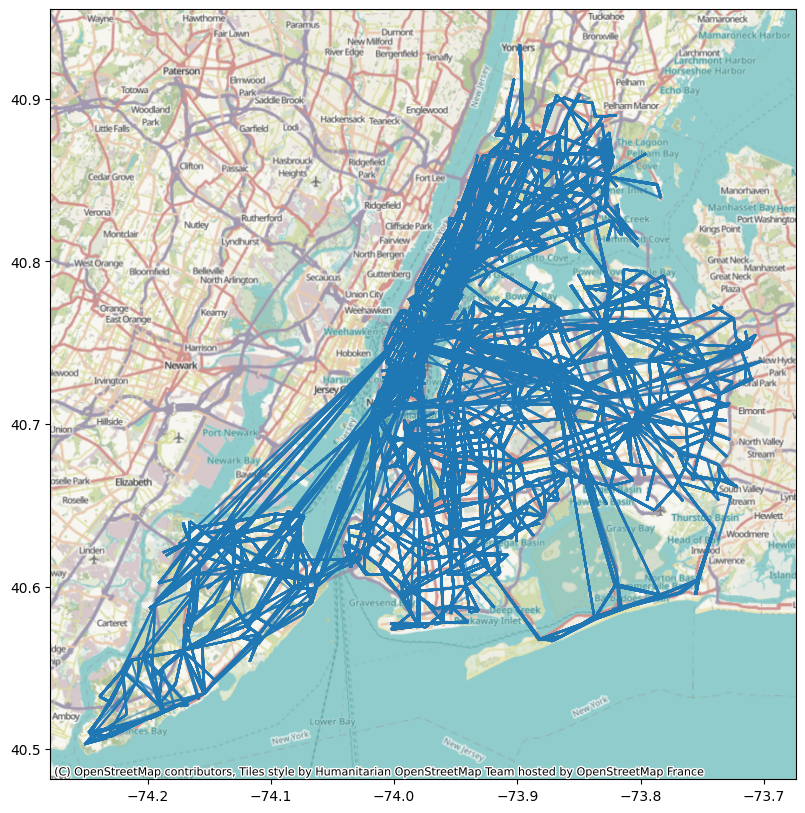

In [10]:
import geopandas as gpd
from shapely.geometry import LineString
import matplotlib.pyplot as plt # Import the pyplot module

# Creating line data between ping points
nyc_ping['line_geometry'] = nyc_ping.apply(lambda row: LineString([(row['timepoint_stop_longitude'], row['timepoint_stop_latitude']), (row['next_timepoint_stop_longitude'], row['next_timepoint_stop_latitude'])]), axis=1)

# Convert the DataFrame to a GeoDataFrame
# The gpd.GeoDataFrame constructor is called directly from the geopandas module.
nyc_ping_gdf = gpd.GeoDataFrame(nyc_ping, geometry='line_geometry', crs='EPSG:4326')

# Plot lines on the contestily basemap
import contextily as ctx
ax = nyc_ping_gdf.plot(figsize=(10, 10), alpha=0.5, markersize=1)
ctx.add_basemap(ax, crs='EPSG:4326')
plt.show()

## We can also color the line segments based on the data

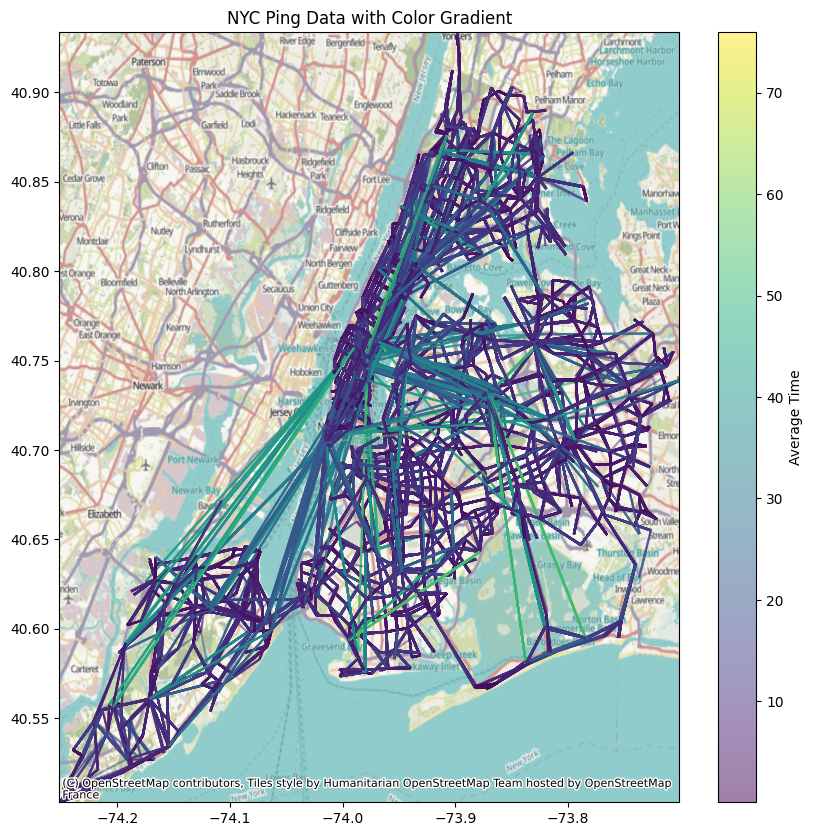

In [13]:
import geopandas as gpd
from shapely.geometry import LineString
import matplotlib.pyplot as plt
import contextily as ctx
from matplotlib.collections import LineCollection
import numpy as np

fig, ax = plt.subplots(figsize=(10, 10))

# Extract coordinates from LineString objects
lines = [list(line.coords) for line in nyc_ping_gdf.geometry]
# The LineCollection expects a sequence of segments,
# where each segment is a sequence of (x, y) coordinates.
# Extracting coordinates this way provides the correct format.


# Create a LineCollection
lc = LineCollection(lines, cmap='viridis', alpha=0.5)

# Set the color array to 'avg_time'
lc.set_array(nyc_ping_gdf['avg_time'])

# Add the LineCollection to the plot
line = ax.add_collection(lc)

# Set the plot limits
ax.set_xlim(nyc_ping_gdf.total_bounds[[0, 2]])
ax.set_ylim(nyc_ping_gdf.total_bounds[[1, 3]])

# Add a colorbar
plt.colorbar(line, ax=ax, label='Average Time')

# Add the basemap
ctx.add_basemap(ax, crs='EPSG:4326')

plt.title('NYC Ping Data with Color Gradient')
plt.show()

## How does travel speed change throughout the day?
We have the average travel time for each hour for each segment. Let's see how travel time changes throughout the day.

In [25]:
import pandas as pd
import requests

# Define hours
hours = sorted(nyc_ping_gdf['hour_of_day'].unique())  # 24 unique hours, 0-23

# Filter ping data by the first hour to initialize ping_hour
ping_hour = nyc_ping_gdf[nyc_ping_gdf['hour_of_day'] == hours[0]]

def update_map(hour_of_day):
    global sm, ping_hour  # Declare ping_hour as global

    ping_hour = nyc_ping_gdf[nyc_ping_gdf['hour_of_day'] == hour_of_day]

    ax.clear()

    #Add basemap
    url = 'https://services5.arcgis.com/GfwWNkhOj9bNBqoJ/arcgis/rest/services/NYC_Census_Tracts_for_2020_US_Census/FeatureServer/0/query?where=1=1&outFields=*&outSR=4326&f=pgeojson'
    census_shp = geopandas.read_file(url) #the geopandas pacakge can convert this to a shapefile
    census_shp.to_crs(nyc_ping_gdf.crs).plot(
        ax = ax,
        edgecolor = 'black',
        facecolor = 'none',  # Make the polygons transparent
        linewidth = 0.2 #boundary width
    )

  #Add ping data
    ping_hour.plot(
        column='avg_time',
        cmap='RdYlGn_r',  # Use the 'RdYlGn_r' colormap (Red-Yellow-Green, reversed)
        linewidth=0.8,
        ax=ax,
        legend=False,
        missing_kwds={
            "color": "lightgray",
            "edgecolor": "none",
        }
    )

    ax.set_xlim(nyc_ping_gdf.total_bounds[[0, 2]])
    ax.set_ylim(nyc_ping_gdf.total_bounds[[1, 3]])

    ax.set_title(f"Average Travel Time at Hour: {hour_of_day}", fontsize=12)
    ax.set_axis_off()

    if sm is None:
        sm = plt.cm.ScalarMappable(cmap="RdYlGn_r",
                                   norm=plt.Normalize(vmin=nyc_ping_gdf['avg_time'].min(),
                                                      vmax=nyc_ping_gdf['avg_time'].max()))
        sm._A = []
        cbar = fig.colorbar(sm, ax=ax, orientation="vertical", fraction=0.03, pad=0.04)
        cbar.set_label("Average Travel Time", fontsize=10)

fig, ax = plt.subplots(1, 1, figsize=(8, 6))
sm = None
ani = FuncAnimation(fig, update_map, frames=hours, interval=1000, repeat=False)
plt.close(fig)
HTML(ani.to_jshtml())

## Analyzing Big Geospatial Data
THIS TOOK HOURS TO RUN, BIG DATA QUERYING IS NOT GOOD IN COLAB, BUT I LEFT IT AS AN EXAMPLE

In this next step, we will utlize the MTA Open Data API to get hourly entrance and exit data for all subway stops in NYC from 2020-2025. This dataset contains 111 million observations as of 03/19/2025.

In [1]:
import pandas as pd
import requests

#def get_all_data(base_url, chunk_size=10000):

  #  Retrieves all data from a Socrata API endpoint, handling pagination.

  #  Args:
   #     base_url (str): The base URL of the API endpoint (without limit/offset).
    #    chunk_size (int): The number of records to retrieve per request.
                          Maximum of 50000 for SODA 2.0.

  #  Returns:
  #      pandas.DataFrame: A DataFrame containing all the data, or None if an error occurs.
  #  """
  #  offset = 0
   # all_data = []
  #  try:
   #     while True:
    #        url = f"{base_url}?$limit={chunk_size}&$offset={offset}"
     #       response = requests.get(url)
       #     response.raise_for_status()  # Raise HTTPError for bad responses (4xx or 5xx)
       #     data = response.json()

       #     if not data:  # Stop if no more data is returned
                break

       #     all_data.extend(data)
       #     offset += chunk_size

       # if all_data:
       #     return pd.DataFrame(all_data)
       # else:
        #    print("No data retrieved.")
        #    return None

   # except requests.exceptions.RequestException as e:
    #    print(f"Request error: {e}")
    #    return None
   # except ValueError as e:
     #   print(f"JSON decoding error: {e}")
     #   return None
  #  except Exception as e:
   #     print(f"An unexpected error occurred: {e}")
    #    return None


# Example usage:
base_url = "https://data.ny.gov/resource/wujg-7c2s.json"
df = get_all_data(base_url)

if df is not None:
    print("Data loaded successfully into a Pandas DataFrame.")
    print(f"DataFrame shape: {df.shape}")  # Print the number of rows and columns
    print(df.head())
else:
    print("Failed to load data.")


KeyboardInterrupt: 